# Computational Finance I
**Lab-Exercise No. 3**


## Write your data

In [3]:
print("First Name: "+ "Zhirui")
print("Sure Name: " + "Tang")
print("Matriculation number: " + "1942800")
print("E-mail: " + "zhirui.tang@uni-wuppertal.de")
print("Degree Type: " + "Master") # Bachelor or Master
print("Degree Name: " + "Master of Science in Computer Simulation in Science") # E.g. Master of Science in Computer Simulation in Science

First Name: Zhirui
Sure Name: Tang
Matriculation number: 1942800
E-mail: zhirui.tang@uni-wuppertal.de
Degree Type: Master
Degree Name: Master of Science in Computer Simulation in Science


# For the programming task write the corresponding Python codes that are asked in each section below.

# P 3: Random number generators
A linear congruential generator is given by the recursion $N_i = aN_{i−1} + b mod M$. Uniform deviates are obtained by $U_i = \frac{N_i}{M}$. 

## Import all necessary modules

In [4]:
from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Start coding
**Note:** 
* Add code where you find the comment "# Add code here"
* Get the same output as it is presented in the Markdown text **Expected Output:**

## Define a function to implement the above pseudo random number generator 

In [5]:
def lcg(M, a, b, N0, k):
    """"
    Function that implements a linear congruential generator
    
    Input: 
          M     -> Given int
          a     -> Given int
          b     -> Given int
          N0    -> Seed
          k     -> Dimension
          
    Output:
         U      -> Pseudo random numbers
    """
    
    N = np.empty(k)
    U = np.empty(k)
    N[0] = N0
    U[0] = N[0] / M
    for i in range(k-1):
        N[i+1] = (a*N[i] + b) % M
        U[i+1] = N[i+1] / M
    return U
    

Let $M = 244944$, $a = 1597$, $b = 51749$. Try seeds $N_0 = 100$ and $N_0 = 1$. Determine $k$ pseudo random numbers, where $k = [100, 1000, 10000]$. Visualise the pseudo random numbers (for each $k$) $U_i$ in $[0,1]$, the pairs $(U_i,U_{i+1})$ in $[0,1]^2$ and the triples $(U_i,U_{i+1},U_{i+2})$ in $[0,1]^3$. What do you observe? When using the seed $N_0 = 1$, calculate the corresponding sample mean and the sample variance. Compare these statistics to the true mean and variance.

## Input parameters

In [6]:
# Input parameters
M = 244944
a = 1597
b = 51749
k = [100, 1000, 10000]
n = len(k)

## Test with $N_0=100$

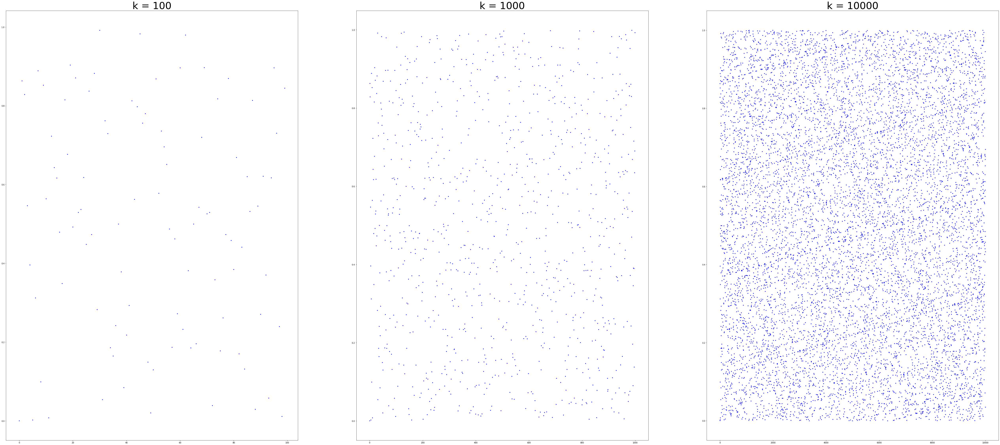

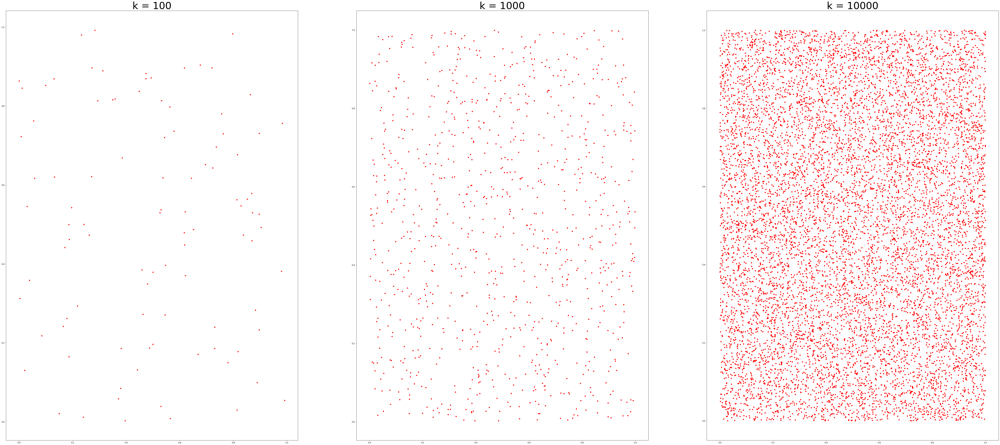

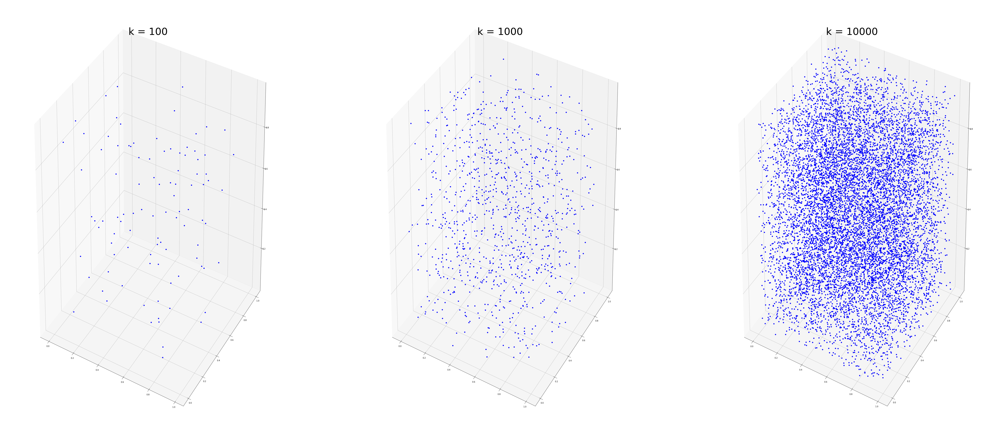

In [8]:
N0 = 100
# Add code here
size=(90,40)
_, axes1 = plt.subplots(1, 3, figsize=size)
_, axes2 = plt.subplots(1, 3, figsize=size)
_, axes3 = plt.subplots(1, 3, figsize=size, subplot_kw={'projection': '3d'})

for i in range(n):
    U = lcg(M, a, b, N0, k[i])
    axes1[i].plot(U, '.b')
    axes1[i].set_title('k = %i' %k[i], fontsize=50)
    axes2[i].plot(U[0:len(U)-1], U[1:len(U)], '.r', markersize=10.0)
    axes2[i].set_title('k = %i' %k[i], fontsize=50)
    axes3[i].plot3D(U[0:len(U)-2], U[1:len(U)-1], U[2:len(U)],'.b', markersize=10.0)
    axes3[i].set_title('k = %i' %k[i], fontsize=50)
    

## Test with $N_0 =1$ 

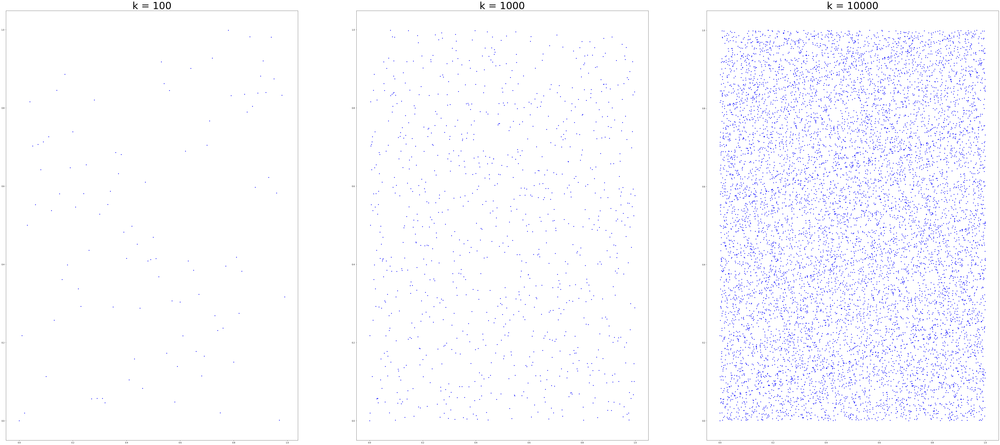

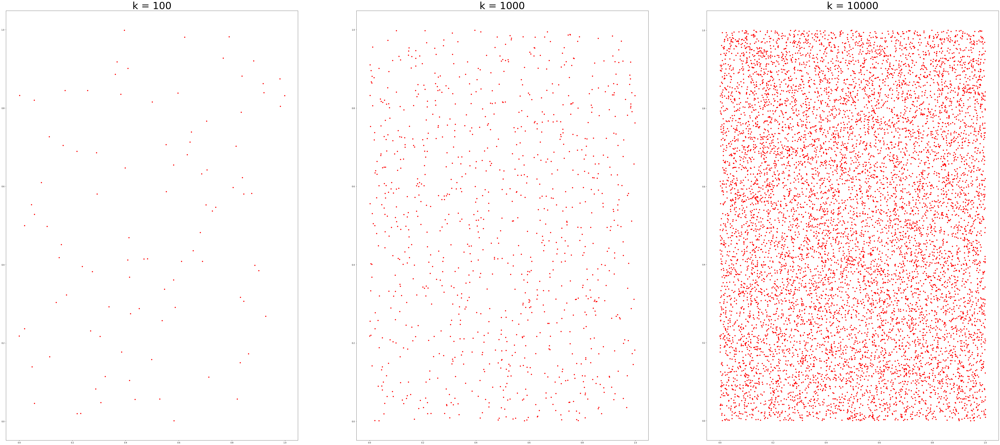

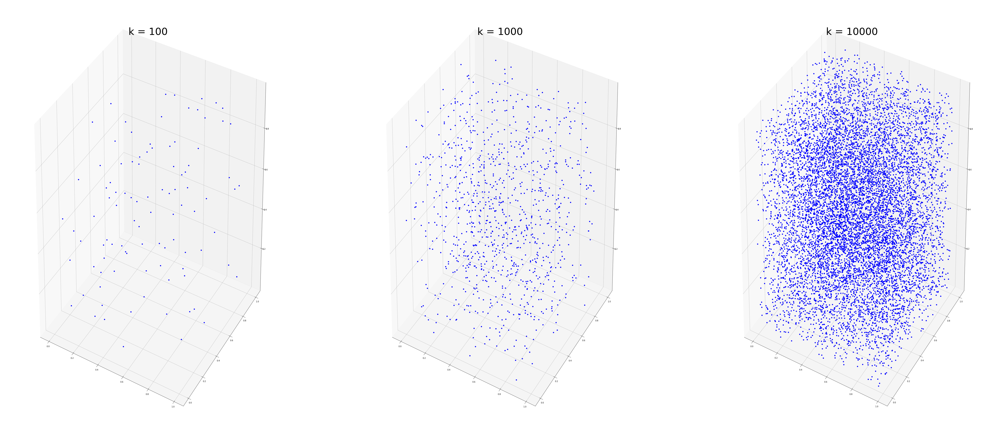

In [9]:
N0 = 1
# Add code here
size=(90,40)
_, axes1 = plt.subplots(1, 3, figsize=size)
_, axes2 = plt.subplots(1, 3, figsize=size)
_, axes3 = plt.subplots(1, 3, figsize=size, subplot_kw={'projection': '3d'})

for i in range(n):
    U = lcg(M, a, b, N0, k[i])
    axes1[i].plot(np.arange(0, 1, 1/k[i]), U, '.b') #set x-axis range from 0 to 1
    axes1[i].set_title('k = %i' %k[i], fontsize=50)
    axes2[i].plot(U[0:len(U)-1], U[1:len(U)], '.r', markersize=10.0)
    axes2[i].set_title('k = %i' %k[i], fontsize=50)
    axes3[i].plot3D(U[0:len(U)-2], U[1:len(U)-1], U[2:len(U)],'.b', markersize=10.0)
    axes3[i].set_title('k = %i' %k[i], fontsize=50)
    

## Compare the statistics for $N_0$

In [10]:
mu = 1/2*np.ones([n, 1])
var = 1/12*np.ones([n, 1])
mu_k = np.empty([n,1])
var_k = np.empty([n,1])
# Add code here
for i in range(n):
    mu_k[i] = np.mean(lcg(M, a, b, N0, k[i]))
    var_k[i] = np.var(lcg(M, a, b, N0, k[i]))
print('%-8s' %"K", '%-16s' %"mu", '%-16s' %"mu_k", '%-16s' %"var", '%-16s' %"var_k")
print('------------------------------------------------------------------')
for i in range(n):
    print('%-8i' %k[i], '%-16.4f' %mu[i], '%-16.4f' %mu_k[i], '%-16.4f' %var[i], '%-16.4f' %var_k[i])



K        mu               mu_k             var              var_k           
------------------------------------------------------------------
100      0.5000           0.4925           0.0833           0.0794          
1000     0.5000           0.4924           0.0833           0.0803          
10000    0.5000           0.5006           0.0833           0.0832          


Implement Marsaglia’s polar algorithm to obtain normal deviates $Z^j, j = 1, 2$. Thereby, use the uniform deviates from the above algorithm ($U_1$ for $N_0 = 100$ and $U_2$ for $N_0 = 1$). Visualise the pseudo random numbers $Z_i^j$ in $[−4, 4]$, the pairs $(Z_i^j, Z_{i+1}^j)$ in $[−4, 4]^2$ and the triples $(Z_i^j, Z_{i+1}^j, Z_{i+2}^j)$ in $[−4, 4]^3$ for $j = 1, 2$.


## Define a function to implement Marsaglia's polar algorithm

In [11]:
def m_polar(U1, U2, k):
    """
    Function that implements Marsaglia's polar algorithm
    
    Input:
        U1 -> Uniform deviates 
        U2 -> Uniform deviates
        k  -> length of above RV
    
    Output:
        Z1 -> Normal deviates
        Z2 -> Normal deviates
        k_new -> length of above RV
    """
    
    # Add code here
    Z1=[]
    Z2=[]
    for i in range(k):
        V1 = 2*U1[i] - 1
        V2 = 2*U2[i] - 1
        if(V1**2+V2**2<1):
            W = V1**2+V2**2
            Z1.append(sqrt(-2*log(W)/W)*V1)
            Z2.append(sqrt(-2*log(W)/W)*V2)
        else:
            continue
    k_new = len(Z1)
    return Z1, Z2, k_new

### Test above function

### Visualization for $Z^1$

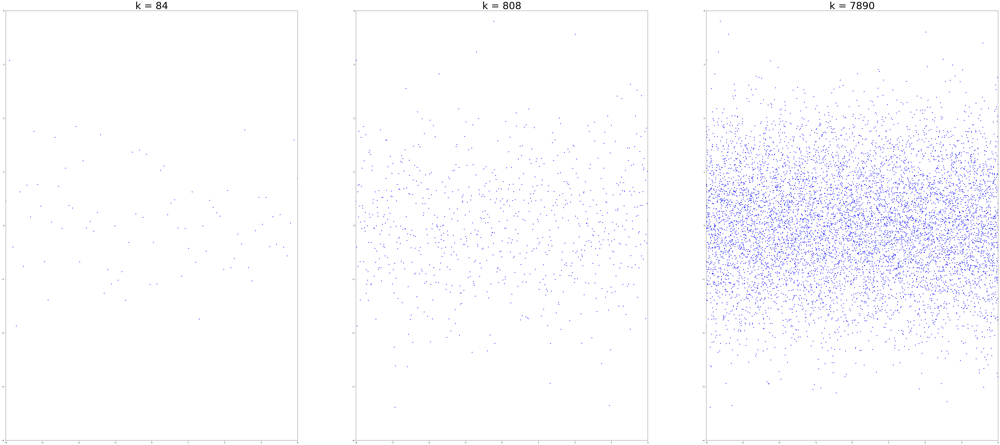

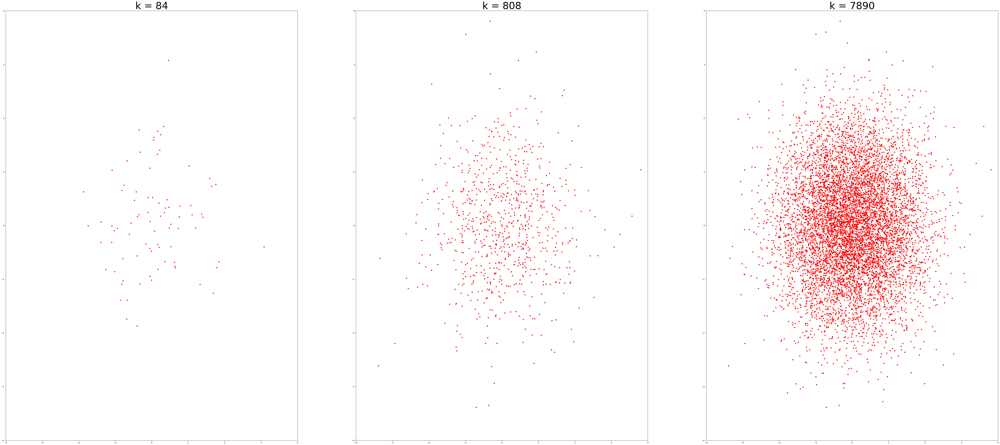

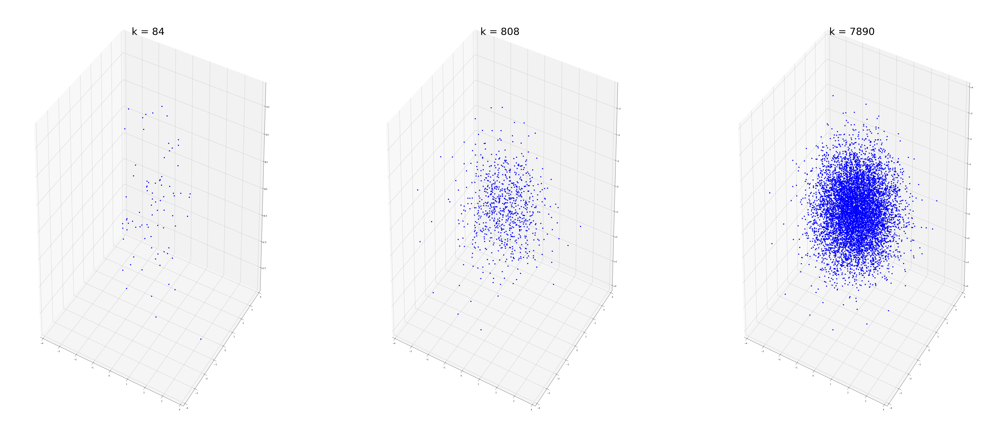

In [12]:
# Add code here
size=(90,40)
_, axes1 = plt.subplots(1, 3, figsize=size)
_, axes2 = plt.subplots(1, 3, figsize=size)
_, axes3 = plt.subplots(1, 3, figsize=size, subplot_kw={'projection': '3d'})

for i in range(n):
    U1=lcg(M, a, b, 100, k[i]) #10000 numbers
    U2=lcg(M, a, b, 1, k[i])
    Z1, _, k_new = m_polar(U1, U2, k[i])
    axes1[i].plot(np.linspace(-4, 4, num=len(Z1)), Z1, '.b')
    axes1[i].set_title('k = %i' %k_new, fontsize=50)
    axes1[i].set_xlim([-4, 4])
    axes1[i].set_ylim([-4, 4])
    axes2[i].plot(Z1[0:k_new-1], Z1[1:k_new], '.r', markersize=10.0)
    axes2[i].set_title('k = %i' %k_new, fontsize=50)
    axes2[i].set_xlim([-4, 4])
    axes2[i].set_ylim([-4, 4])
    axes3[i].plot3D(Z1[0:k_new-2], Z1[1:k_new-1], Z1[2:k_new],'.b', markersize=10.0)
    axes3[i].set_title('k = %i' %k_new, fontsize=50)
    axes3[i].set_xlim([-4, 4])
    axes3[i].set_ylim([-4, 4])


   

    

### Visualization for $Z^2$

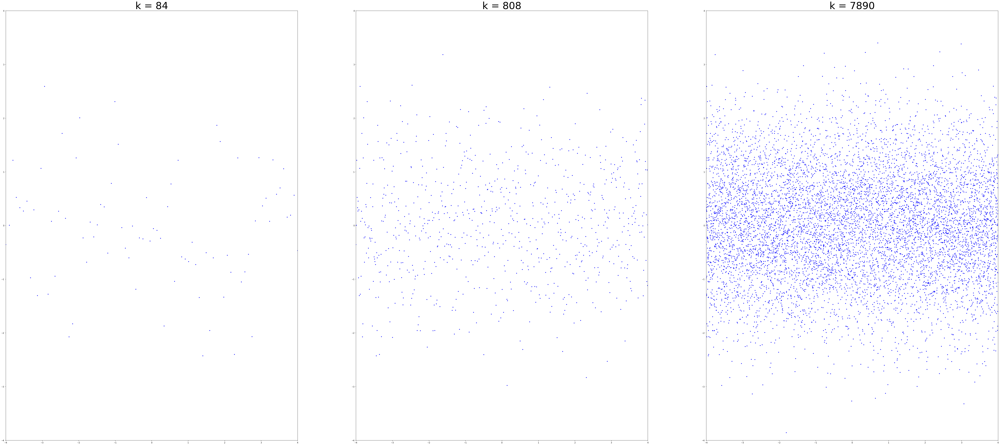

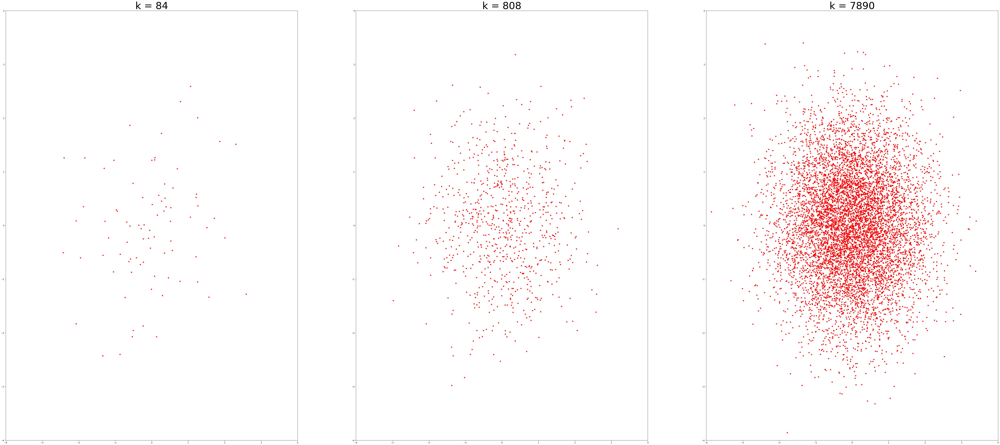

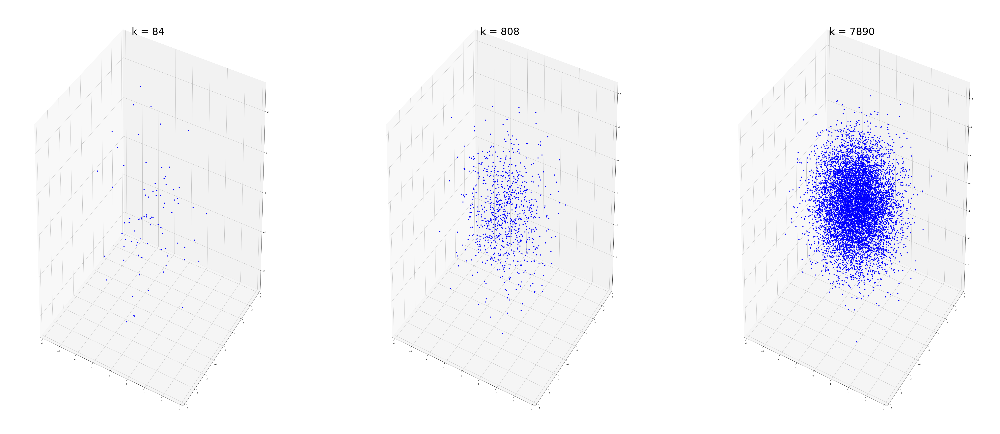

In [13]:
# Add code here
size=(90,40)
_, axes1 = plt.subplots(1, 3, figsize=size)
_, axes2 = plt.subplots(1, 3, figsize=size)
_, axes3 = plt.subplots(1, 3, figsize=size, subplot_kw={'projection': '3d'})

for i in range(n):
    U1=lcg(M, a, b, 100, k[i]) #10000 numbers
    U2=lcg(M, a, b, 1, k[i])
    _, Z2, k_new = m_polar(U1, U2, k[i])
    axes1[i].plot(np.linspace(-4, 4, num=len(Z2)), Z2, '.b')
    axes1[i].set_title('k = %i' %k_new, fontsize=50)
    axes1[i].set_xlim([-4, 4])
    axes1[i].set_ylim([-4, 4])
    axes2[i].plot(Z2[0:k_new-1], Z2[1:k_new], '.r', markersize=10.0)
    axes2[i].set_title('k = %i' %k_new, fontsize=50)
    axes2[i].set_xlim([-4, 4])
    axes2[i].set_ylim([-4, 4])
    axes3[i].plot3D(Z2[0:k_new-2], Z2[1:k_new-1], Z2[2:k_new],'.b', markersize=10.0)
    axes3[i].set_title('k = %i' %k_new, fontsize=50)
    axes3[i].set_xlim([-4, 4])
    axes3[i].set_ylim([-4, 4])

## Compare the statistics

In [20]:
mu_z = np.zeros([n, 1])
var_z = np.ones([n, 1])
# Add code here
mu_z1_k = np.empty([n,1])
var_z1_k = np.empty([n,1])
mu_z2_k = np.empty([n,1])
var_z2_k = np.empty([n,1])
k_new=np.empty([n,1])
for i in range(n):
    U1=lcg(M, a, b, 100, k[i])
    U2=lcg(M, a, b, 1, k[i])
    Z1, Z2, k_new[i] = m_polar(U1, U2, k[i])
    mu_z1_k[i] = np.mean(Z1)
    var_z1_k[i] = np.var(Z1)
    mu_z2_k[i] = np.mean(Z2)
    var_z2_k[i] = np.var(Z2)
    
print('%-8s' %"k_new", '%-16s' %"mu_z", '%-16s' %"mu_z1_k", '%-16s' %"var_z", '%-16s' %"var_z1_k")
print('-------------------------------------------------------------------')
for i in range(n):
    print('%-8i' %k_new[i], '%-16.4f' %mu_z[i], '%-16.4f' %mu_z1_k[i], '%-16.4f' %var_z[i], '%-16.4f' %var_z1_k[i])

print('\n')

print('%-8s' %"k_new", '%-16s' %"mu_z", '%-16s' %"mu_z2_k", '%-16s' %"var_z", '%-16s' %"var_z2_k")
print('-------------------------------------------------------------------')
for i in range(n):
    print('%-8i' %k_new[i], '%-16.4f' %mu_z[i], '%-16.4f' %mu_z2_k[i], '%-16.4f' %var_z[i], '%-16.4f' %var_z2_k[i])

k_new    mu_z             mu_z1_k          var_z            var_z1_k        
-------------------------------------------------------------------
84       0.0000           0.0863           1.0000           0.8204          
808      0.0000           0.0268           1.0000           1.0515          
7890     0.0000           0.0031           1.0000           0.9812          


k_new    mu_z             mu_z2_k          var_z            var_z2_k        
-------------------------------------------------------------------
84       0.0000           -0.0545          1.0000           1.1018          
808      0.0000           0.0543           1.0000           1.0221          
7890     0.0000           0.0022           1.0000           0.9890          


In [15]:
# feel free to use this cell for additional tests

In [16]:
# feel free to use this cell for additional tests

In [17]:
# feel free to use this cell for additional tests

In [18]:
# feel free to use this cell for additional tests

In [19]:
# feel free to use this cell for additional tests